In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


### 모델 학습을 위한 데이터셋 불러오기

In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [4]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_dog.jpg': File exists


In [5]:
from tensorflow.io import read_file
from tensorflow.image import decode_image
import glob
import os

data_dir = '~/aiffel/cats_vs_dogs/*.jpg'
for image in sorted(glob.glob(data_dir)):
        img = read_file(str(image))
        img = decode_image(img)
        if img.shape[2] != 3:
           print(image)
           os.remove(image)

In [6]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs/',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


##### Dataset의 shape이 (None, None, 3)으로 나타나는 이유
- 모든 이미지 데이터의 width와 height이 일정하지 않고 다르기 때문이다.
- 즉, 사이즈가 정해져있지 않기 때문에 None이라고 나타납니다.

### 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있도록 전처리하기

In [8]:
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

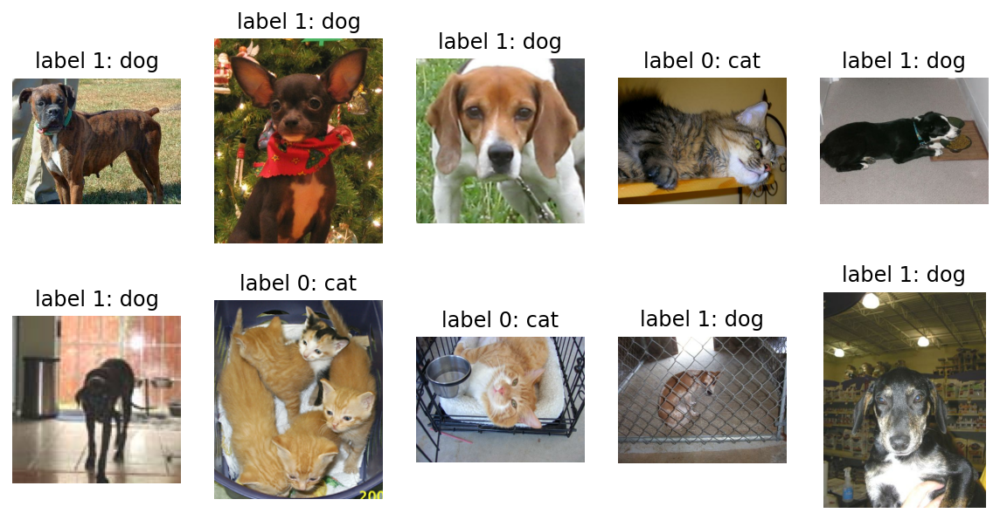

In [9]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

##### 각 모델의 이미지 사이즈가 서로 다름
- 고양이는 label 0, 강아지는 label 1로 설정되어 있다.
- 각 이미지의 사이즈가 다르기에, 모델에 넣기 위해서 resize하는 과정을 거칩니다.
- format_example() 함수를 통해 이미지를 같은 포맷으로 통일시켜 줍니다.

In [10]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [11]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


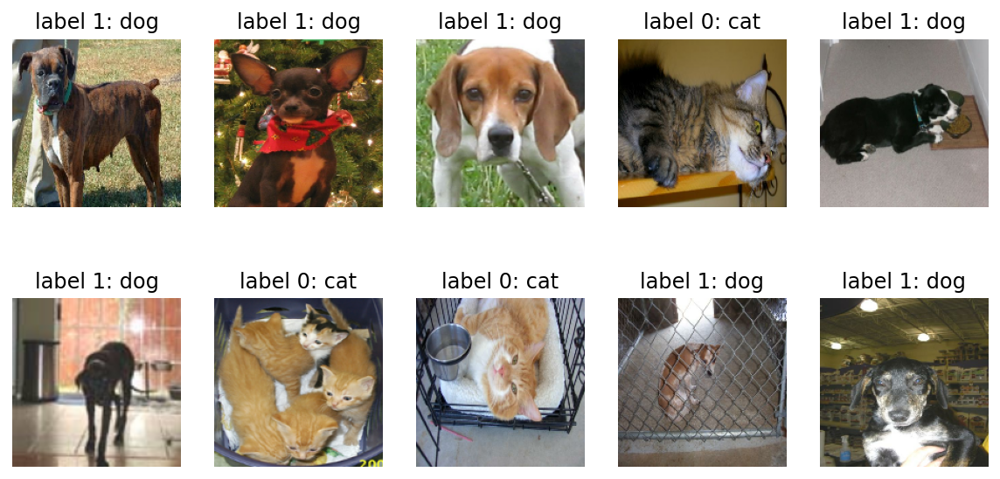

In [12]:
plt.figure(figsize = (10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1)/2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### 텐서플로우를 통해 모델 구조 설계

In [13]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [14]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [15]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

### 모델 compile 완료 후 학습시키기

In [16]:
learning_rate = 0.0001

model.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics = ['accuracy'])

In [17]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [18]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [19]:
# Train Batch에서 하나의 데이터만 추출
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

#### 학습 전 성능 확인

In [20]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 0.6817 - accuracy: 0.5990

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 3s 27ms/step - loss: 0.6853 - accuracy: 0.5719
initial loss: 0.69
initial accuracy: 0.57


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


In [21]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
170/582 [=======>......................] - ETA: 17s - loss: 0.6541 - accuracy: 0.6039

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.6459 - accuracy: 0.6177

212/582 [=========>....................] - ETA: 15s - loss: 0.6433 - accuracy: 0.6201

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.6290 - accuracy: 0.6350

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.5932 - accuracy: 0.6729

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.5924 - accuracy: 0.6740

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.5915 - accuracy: 0.6745

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.5858 - accuracy: 0.6794

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.5853 - accuracy: 0.6803

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.5835 - accuracy: 0.6819

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 44ms/step - loss: 0.5835 - accuracy: 0.6819 - val_loss: 0.5347 - val_accuracy: 0.7291
Epoch 2/10
170/582 [=======>......................] - ETA: 17s - loss: 0.5069 - accuracy: 0.7632

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.5022 - accuracy: 0.7672

212/582 [=========>....................] - ETA: 15s - loss: 0.5025 - accuracy: 0.7667

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.4992 - accuracy: 0.7650

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4862 - accuracy: 0.7691

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4855 - accuracy: 0.7696

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.4841 - accuracy: 0.7704

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4822 - accuracy: 0.7722

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4820 - accuracy: 0.7724

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4812 - accuracy: 0.7732

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.4811 - accuracy: 0.7733 - val_loss: 0.4824 - val_accuracy: 0.7777
Epoch 3/10
169/582 [=======>......................] - ETA: 17s - loss: 0.4408 - accuracy: 0.8012

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 16s - loss: 0.4435 - accuracy: 0.8001

213/582 [=========>....................] - ETA: 15s - loss: 0.4423 - accuracy: 0.8003

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.4343 - accuracy: 0.8034

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.4245 - accuracy: 0.8056

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.4246 - accuracy: 0.8061

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.4244 - accuracy: 0.8061

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.4235 - accuracy: 0.8073

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.4234 - accuracy: 0.8071

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4231 - accuracy: 0.8064

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.4230 - accuracy: 0.8065 - val_loss: 0.4649 - val_accuracy: 0.7928
Epoch 4/10
170/582 [=======>......................] - ETA: 17s - loss: 0.3946 - accuracy: 0.8298

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.3941 - accuracy: 0.8292

212/582 [=========>....................] - ETA: 15s - loss: 0.3933 - accuracy: 0.8292

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.3845 - accuracy: 0.8336

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3743 - accuracy: 0.8360

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3739 - accuracy: 0.8363

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.3731 - accuracy: 0.8369

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3720 - accuracy: 0.8382

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.3719 - accuracy: 0.8382

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3711 - accuracy: 0.8383

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.3710 - accuracy: 0.8384 - val_loss: 0.5189 - val_accuracy: 0.7584
Epoch 5/10
169/582 [=======>......................] - ETA: 17s - loss: 0.3484 - accuracy: 0.8532

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.3454 - accuracy: 0.8541

213/582 [=========>....................] - ETA: 16s - loss: 0.3465 - accuracy: 0.8530

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.3395 - accuracy: 0.8573

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.3271 - accuracy: 0.8623

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.3273 - accuracy: 0.8618

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 2s - loss: 0.3273 - accuracy: 0.8613

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.3258 - accuracy: 0.8621

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.3256 - accuracy: 0.8621

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.3261 - accuracy: 0.8616

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.3260 - accuracy: 0.8616 - val_loss: 0.5187 - val_accuracy: 0.7657
Epoch 6/10
170/582 [=======>......................] - ETA: 17s - loss: 0.3000 - accuracy: 0.8768

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.2982 - accuracy: 0.8775

212/582 [=========>....................] - ETA: 15s - loss: 0.2963 - accuracy: 0.8784

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2898 - accuracy: 0.8815

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.2808 - accuracy: 0.8834

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.2807 - accuracy: 0.8837

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.2795 - accuracy: 0.8842

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.2791 - accuracy: 0.8847

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.2794 - accuracy: 0.8844

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.2786 - accuracy: 0.8844

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.2785 - accuracy: 0.8845 - val_loss: 0.4694 - val_accuracy: 0.7932
Epoch 7/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2519 - accuracy: 0.8976

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.2499 - accuracy: 0.8979

212/582 [=========>....................] - ETA: 15s - loss: 0.2505 - accuracy: 0.8983

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.2460 - accuracy: 0.8998

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.2396 - accuracy: 0.9024

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.2383 - accuracy: 0.9033

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.2382 - accuracy: 0.9031

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.2377 - accuracy: 0.9036

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.2375 - accuracy: 0.9036

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.2368 - accuracy: 0.9039

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.2367 - accuracy: 0.9040 - val_loss: 0.5005 - val_accuracy: 0.7898
Epoch 8/10
170/582 [=======>......................] - ETA: 17s - loss: 0.2125 - accuracy: 0.9165

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 16s - loss: 0.2066 - accuracy: 0.9209

212/582 [=========>....................] - ETA: 15s - loss: 0.2081 - accuracy: 0.9195

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.2060 - accuracy: 0.9175

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1986 - accuracy: 0.9231

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1984 - accuracy: 0.9229

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1978 - accuracy: 0.9232

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1959 - accuracy: 0.9244

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1958 - accuracy: 0.9245

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1958 - accuracy: 0.9244

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 45ms/step - loss: 0.1958 - accuracy: 0.9245 - val_loss: 0.5165 - val_accuracy: 0.7958
Epoch 9/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1712 - accuracy: 0.9331

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1723 - accuracy: 0.9329

212/582 [=========>....................] - ETA: 15s - loss: 0.1711 - accuracy: 0.9340

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


284/582 [=============>................] - ETA: 12s - loss: 0.1666 - accuracy: 0.9362

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1611 - accuracy: 0.9391

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1603 - accuracy: 0.9397

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1604 - accuracy: 0.9397

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1585 - accuracy: 0.9407

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.1582 - accuracy: 0.9409

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1577 - accuracy: 0.9410

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1577 - accuracy: 0.9410 - val_loss: 0.5574 - val_accuracy: 0.7949
Epoch 10/10
170/582 [=======>......................] - ETA: 17s - loss: 0.1384 - accuracy: 0.9533

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


202/582 [=========>....................] - ETA: 15s - loss: 0.1361 - accuracy: 0.9537

212/582 [=========>....................] - ETA: 15s - loss: 0.1356 - accuracy: 0.9542

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 12s - loss: 0.1335 - accuracy: 0.9548

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.1262 - accuracy: 0.9572

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.1256 - accuracy: 0.9573

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.1252 - accuracy: 0.9574

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.1247 - accuracy: 0.9575

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1251 - accuracy: 0.9573

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1241 - accuracy: 0.9580

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 27s 44ms/step - loss: 0.1241 - accuracy: 0.9580 - val_loss: 0.5726 - val_accuracy: 0.8027


### 학습 오류


- 상기 오류는 Dataset의 이미지에서 발생하는 것으로 보입니다.
- 17년도부터 발생했던 문제인데, 아직 해결되지 않은 것 같습니다.
- 참고 링크 : https://github.com/tensorflow/datasets/issues/2188

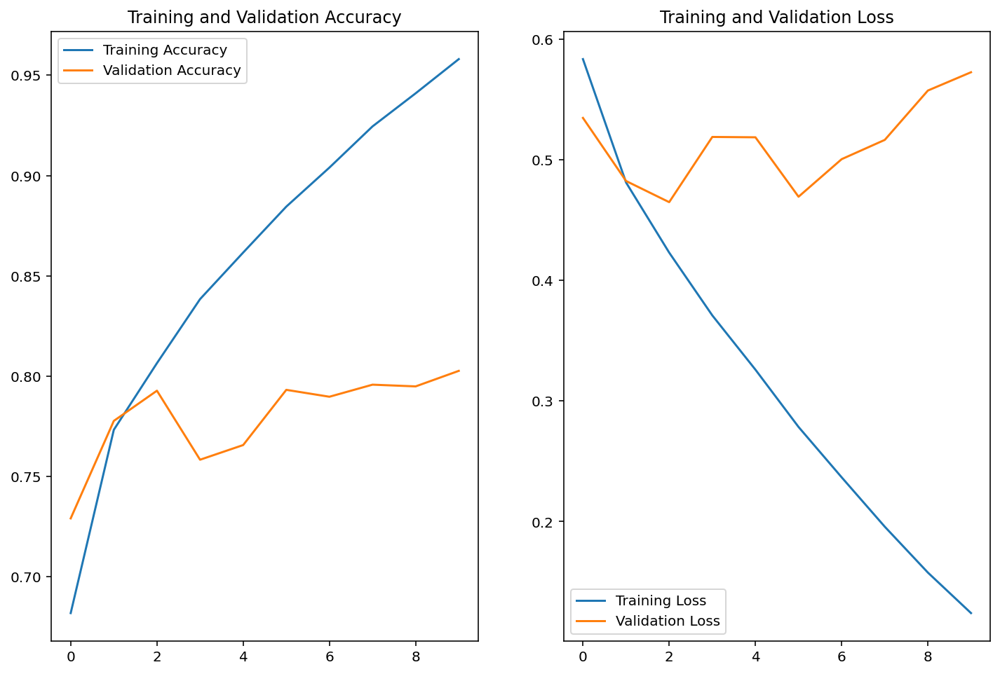

In [22]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

### 모델 예측 결과 확인

In [23]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[9.99887943e-01, 1.12061607e-04],
       [7.79621005e-01, 2.20379055e-01],
       [5.34982741e-01, 4.65017259e-01],
       [9.99942303e-01, 5.76902057e-05],
       [5.85882545e-01, 4.14117485e-01],
       [2.29168206e-01, 7.70831823e-01],
       [5.26255250e-01, 4.73744750e-01],
       [5.77805102e-01, 4.22194868e-01],
       [2.30476651e-02, 9.76952314e-01],
       [7.88313210e-01, 2.11686760e-01],
       [2.89602727e-01, 7.10397243e-01],
       [9.99700904e-01, 2.99123727e-04],
       [9.72026050e-01, 2.79740188e-02],
       [6.80129044e-04, 9.99319911e-01],
       [9.94984984e-01, 5.01500536e-03],
       [9.93963659e-01, 6.03629975e-03],
       [9.33545351e-01, 6.64546266e-02],
       [1.80505728e-03, 9.98194993e-01],
       [6.35729253e-01, 3.64270717e-01],
       [9.46498513e-01, 5.35014719e-02],
       [9.47840273e-01, 5.21597825e-02],
       [2.34958276e-01, 7.65041769e-01],
       [9.99978662e-01, 2.13453586e-05],
       [9.97838080e-01, 2.16199574e-03],
       [9.923464

In [25]:
import numpy as np

predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0])

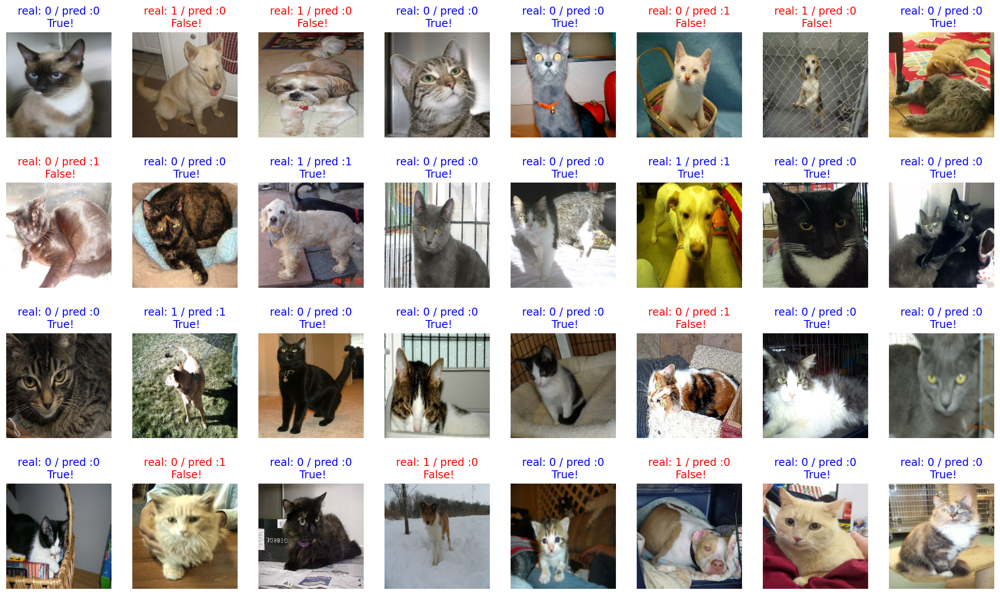

In [26]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [27]:
count = 0

for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count +=1
        
print(count / 32 * 100)

71.875


###  Transfer Learning - VGG16
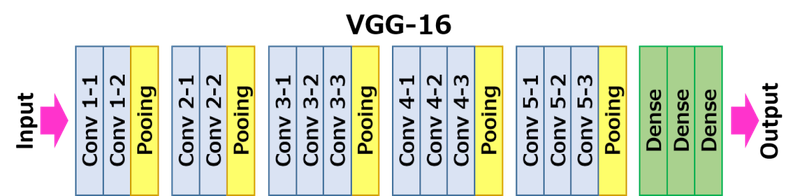

In [28]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [29]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [30]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [31]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

### Global Average Pooling (GAP)
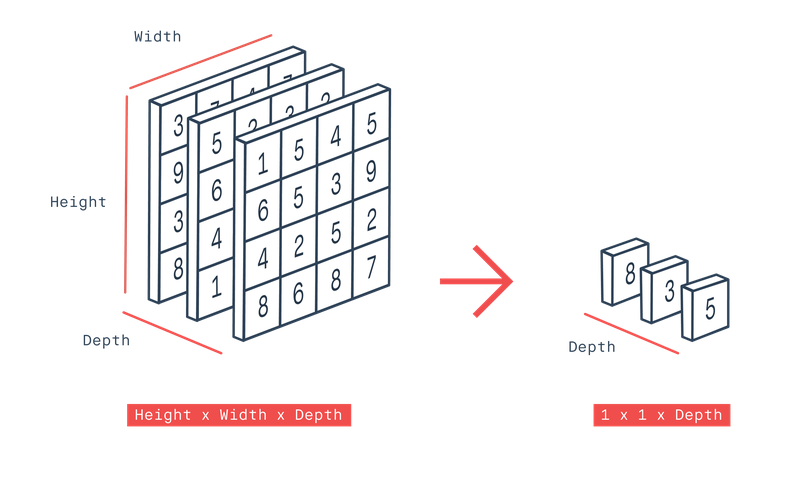

- 겹겹이 쌓여있는 2차원 배열의 평균을 구해 각각 하나의 값으로 축소하는 방법입니다.
- **평균 값을 이용해 차원을 축소**하는 방법

In [32]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [33]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [34]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [41]:
from tensorflow.keras.layers import Dense

dense_layer = Dense(512, activation='relu')
prediction_layer = Dense(2, activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [42]:
base_model.trainable = False

In [43]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [44]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


### VGG16을 기반으로 구성된 분류기를 학습시키고, 직접 만들었던 모델과 비교해보기

In [61]:
learning_rate = 0.0001

model.compile(optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate),
             loss = tf.keras.losses.sparse_categorical_crossentropy,
             metrics = ['accuracy'])

In [62]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 6/20 [========>.....................] - ETA: 1s - loss: 0.1836 - accuracy: 0.9219

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.1653 - accuracy: 0.9236

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 2s 66ms/step - loss: 0.1630 - accuracy: 0.9297
initial loss: 0.16
initial accuracy: 0.93


In [63]:
EPOCHS = 5 
history = model.fit(train_batches,
    epochs=EPOCHS,
    validation_data=validation_batches)

Epoch 1/5
167/582 [=======>......................] - ETA: 33s - loss: 0.1258 - accuracy: 0.9469

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1284 - accuracy: 0.9458

210/582 [=========>....................] - ETA: 30s - loss: 0.1305 - accuracy: 0.9457

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1319 - accuracy: 0.9451

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1320 - accuracy: 0.9454

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1318 - accuracy: 0.9455

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1318 - accuracy: 0.9455

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1318 - accuracy: 0.9454

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1319 - accuracy: 0.9454

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1308 - accuracy: 0.9462

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 91ms/step - loss: 0.1308 - accuracy: 0.9462 - val_loss: 0.1449 - val_accuracy: 0.9420
Epoch 2/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1247 - accuracy: 0.9493

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1254 - accuracy: 0.9505

210/582 [=========>....................] - ETA: 30s - loss: 0.1248 - accuracy: 0.9504

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1296 - accuracy: 0.9471

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1280 - accuracy: 0.9479

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1280 - accuracy: 0.9477

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1284 - accuracy: 0.9474

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1283 - accuracy: 0.9475

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1279 - accuracy: 0.9475

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1274 - accuracy: 0.9476

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 89ms/step - loss: 0.1274 - accuracy: 0.9476 - val_loss: 0.1351 - val_accuracy: 0.9458
Epoch 3/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1223 - accuracy: 0.9478

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1207 - accuracy: 0.9491

210/582 [=========>....................] - ETA: 30s - loss: 0.1205 - accuracy: 0.9494

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1285 - accuracy: 0.9457

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1271 - accuracy: 0.9471

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1269 - accuracy: 0.9470

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1260 - accuracy: 0.9475

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1253 - accuracy: 0.9481

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1252 - accuracy: 0.9481

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1255 - accuracy: 0.9484

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 90ms/step - loss: 0.1255 - accuracy: 0.9484 - val_loss: 0.1349 - val_accuracy: 0.9441
Epoch 4/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1188 - accuracy: 0.9527

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1212 - accuracy: 0.9517

210/582 [=========>....................] - ETA: 30s - loss: 0.1215 - accuracy: 0.9516

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1253 - accuracy: 0.9494

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1237 - accuracy: 0.9496

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1239 - accuracy: 0.9494

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1236 - accuracy: 0.9495

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1240 - accuracy: 0.9494

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1235 - accuracy: 0.9497

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1230 - accuracy: 0.9502

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 54s 90ms/step - loss: 0.1230 - accuracy: 0.9502 - val_loss: 0.1429 - val_accuracy: 0.9398
Epoch 5/5
167/582 [=======>......................] - ETA: 34s - loss: 0.1179 - accuracy: 0.9523

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 31s - loss: 0.1174 - accuracy: 0.9525

210/582 [=========>....................] - ETA: 30s - loss: 0.1186 - accuracy: 0.9524

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 24s - loss: 0.1227 - accuracy: 0.9501

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1231 - accuracy: 0.9506

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1236 - accuracy: 0.9504

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 5s - loss: 0.1228 - accuracy: 0.9509

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 3s - loss: 0.1226 - accuracy: 0.9506

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.1218 - accuracy: 0.9510

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1215 - accuracy: 0.9514

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 53s 90ms/step - loss: 0.1215 - accuracy: 0.9514 - val_loss: 0.1326 - val_accuracy: 0.9458


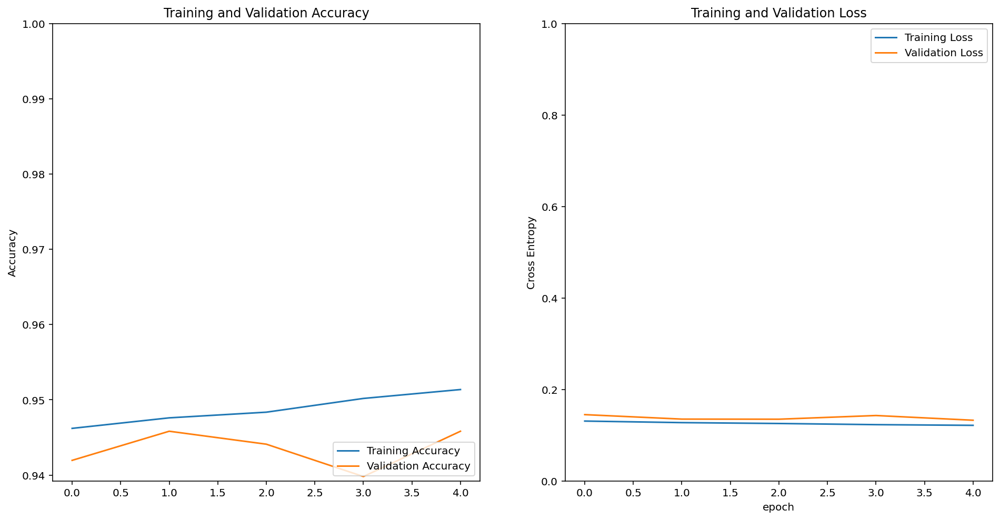

In [64]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [68]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99997020e-01, 3.01773093e-06],
       [5.26865162e-02, 9.47313488e-01],
       [3.01720589e-01, 6.98279440e-01],
       [9.99998808e-01, 1.24986718e-06],
       [9.98929322e-01, 1.07065775e-03],
       [9.88979697e-01, 1.10203046e-02],
       [7.91385683e-05, 9.99920845e-01],
       [7.28141725e-01, 2.71858215e-01],
       [9.79298949e-01, 2.07011234e-02],
       [9.69215989e-01, 3.07839680e-02],
       [1.88361646e-05, 9.99981165e-01],
       [9.99983668e-01, 1.63212608e-05],
       [9.90474522e-01, 9.52553190e-03],
       [9.06301580e-07, 9.99999046e-01],
       [9.99272883e-01, 7.27146224e-04],
       [9.91338253e-01, 8.66175443e-03],
       [9.98535037e-01, 1.46491395e-03],
       [2.61966474e-02, 9.73803341e-01],
       [7.74157345e-01, 2.25842625e-01],
       [9.96096790e-01, 3.90317850e-03],
       [9.45339501e-01, 5.46605214e-02],
       [9.85998869e-01, 1.40011236e-02],
       [9.96055484e-01, 3.94455250e-03],
       [9.89694059e-01, 1.03059895e-02],
       [9.992172

In [72]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

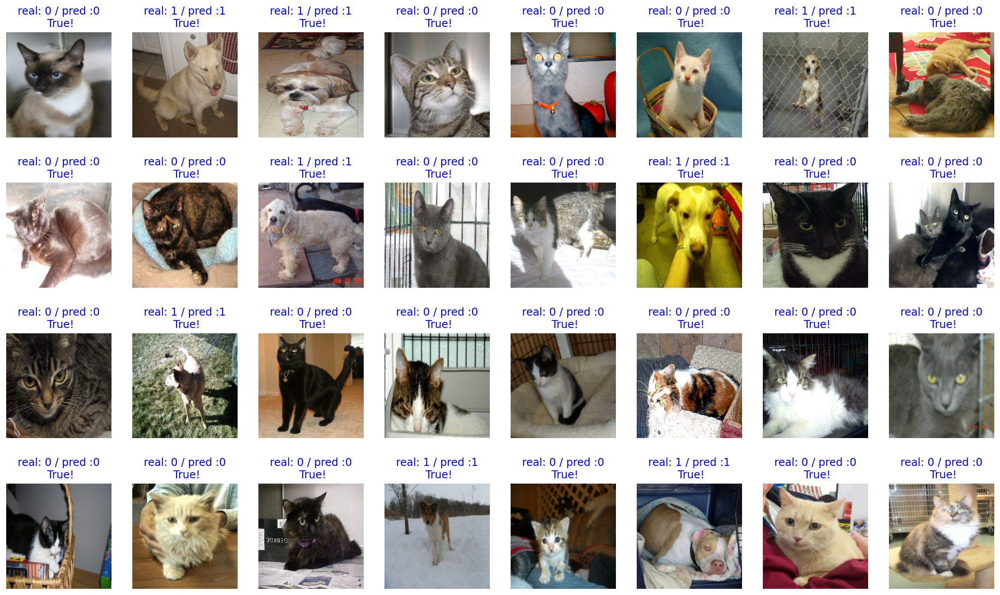

In [73]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [74]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


### 모델 저장

In [75]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
    print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [77]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

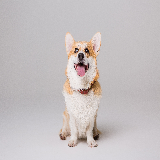

In [78]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [80]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [81]:
prediction = model.predict(dog_image)
prediction

array([[9.2433855e-21, 1.0000000e+00]], dtype=float32)

In [82]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


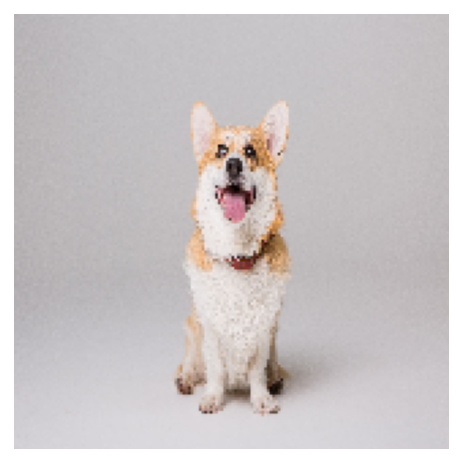

In [83]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


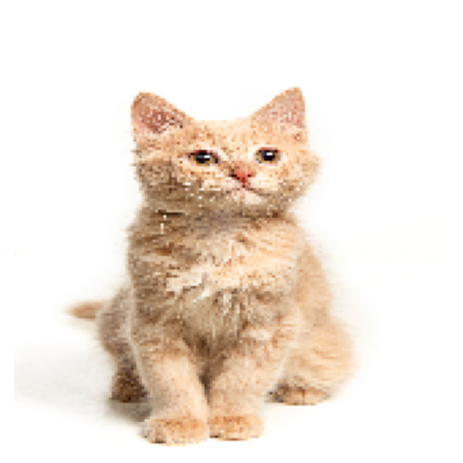

In [84]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


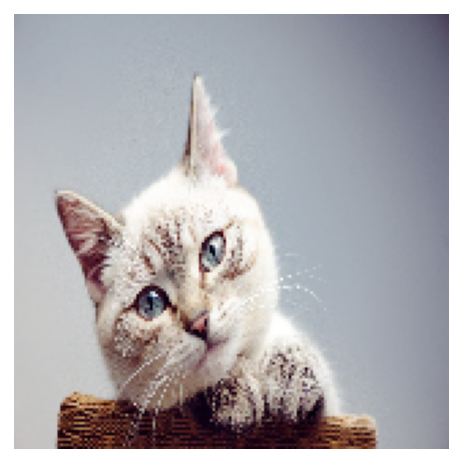

In [85]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)

This image seems 100% dog, and 0% cat.


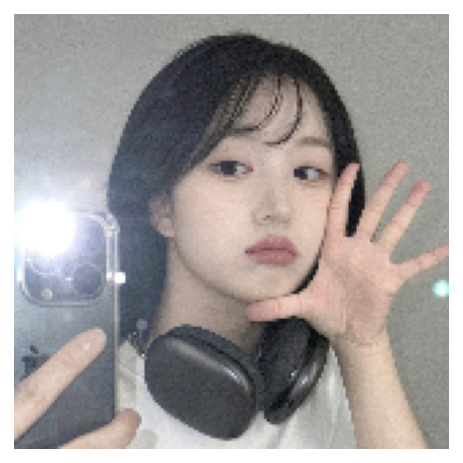

In [103]:
show_and_predict_image(img_dir_path, '오해원.jpg')

- 머리가 정돈되어 있는 사람은 모두 강아지 상으로 분류한다.
- 고양이 상으로 분류될 때, 머리카락이 고양이의 털처럼 보이는 경우에 고양이로 분류합니다.
- 대체로 강아지로 분류하는 경향이 존재

### 부록

1. Map함수 적용
    - for문 없이 함수를 빠르게 리스트에 적용할 수 있다.

In [104]:
a = [1.2, 2.5, 3.7, 4.6] 
a = list(map(int, a)) # 리스트의 요소를 정수로 변환 하여 리스트로 생성
a

[1, 2, 3, 4]

In [105]:
b = [i for i in range(10)]
b = list(map(str, b))
b

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

2. Flatten 함수 이해
    - 1차원 벡터로 펴주는 것을 의미한다.

In [106]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [107]:
image.flatten()

array([1, 2, 3, 4])